In [1]:
import numpy as np
import sympy as sp
import scipy.integrate as itg
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D

In [2]:
extra_plots = False

# grid parameters
N = 2000
R_max = 10
alpha = 5
dx = 1/(N-1)

# sponge layer parameters
R_sponge = 0.75*R_max
gamma_0 = 7
p = 3

# potential parameters
m = 1
mu = 1

# Courant-Friedrichs-Lewy stability condition
C_CFL = 0.4

# Dimension
d = 3

In [3]:
# Self-interaction potential

phi_symb = sp.symbols('phi')

def spV(phi_symb):
    return 1/2*m**2*phi_symb**2 - 1/4*mu*phi_symb**4
def spdV_dphi(phi_symb):
    return sp.diff(V(phi_symb), phi_symb)

V = sp.lambdify(phi_symb, spV(phi_symb))
dV_dphi = sp.lambdify(phi_symb, spdV_dphi(phi_symb))

if extra_plots:
    list = np.linspace(-2, 2, 100)
    Vlist = np.zeros_like(list)
    dVlist = np.zeros_like(list)
    for i, l in np.ndenumerate(list):
        Vlist[i] = V(l)
        dVlist[i] = dV_dphi(l)
    fig, ax = plt.subplots(1, 1, figsize=(6, 5))
    ax.plot(list, Vlist)
    ax.plot(list, dVlist)
    ax.set_title('Potential functions $V(\\phi)$ and $V\'(\\phi)$')
    ax.set_xlabel('$\\phi$')
    ax.set_ylabel('Values')
    ax.legend(['$V(\\phi)$', '$V\'(\\phi)$'])

In [4]:
# Non-uniform coordinate mapping

x = np.linspace(0, 1, N)
r = np.zeros_like(x)
dr_dx = np.zeros_like(x)
d2r_dx2 = np.zeros_like(x)
gamma = np.zeros_like(x)

for i in range(N):
    r[i] = R_max * (np.sinh(alpha * x[i]) / np.sinh(alpha))
    dr_dx[i] = R_max * (alpha * np.cosh(alpha * x[i]) / np.sinh(alpha))
    d2r_dx2[i] = R_max * (alpha**2 * np.sinh(alpha * x[i]) / np.sinh(alpha))
    if r[i] > R_sponge:
        gamma[i] = gamma_0 * ((r[i] - R_sponge) / (R_max - R_sponge))**p

dr_min = alpha*R_max/np.sinh(alpha)*dx

if extra_plots:
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(x, r)
    axs[0].plot(x, dr_dx)
    axs[0].plot(x, d2r_dx2)
    axs[0].set_title('Grid mapping functions r(x), r\'(x), r\"(x)')
    axs[0].set_xlabel('x')
    axs[0].set_ylabel('Values')
    axs[0].legend(['r(x)', 'r\'(x)', 'r\"(x)'])

    axs[1].plot(x, gamma)
    axs[1].set_title('Sponge layer damping factor $\\gamma(x)$')
    axs[1].set_xlabel('x')
    axs[1].set_ylabel('$\\gamma(x)$')
    axs[1].legend(['$\\gamma(x)$ = $\\gamma_0 \\left(\\frac{r(x) - R_{sponge}}{R_{max} - R_{sponge}}\\right)^p$'])

In [5]:
# System of ODEs

def system(t, state):
    phi = state[:N]
    Pi = state[N:]

    #boundary conditions
    phi[-1] = 0
    Pi[-1] = 0

    dphi = Pi.copy()
    dPi = np.zeros_like(Pi)

    dPi[0] = (
    d/(dr_dx[0]**2) * (2*(phi[1]-phi[0])/(dx**2))
    - dV_dphi(phi[0])
    )
    
    dPi[1:-1] = (
    1/(dr_dx[1:-1]**2) * ((phi[2:]-2*phi[1:-1]+phi[:-2])/(dx**2))
    + ((d-1)/(r[1:-1]*dr_dx[1:-1])-d2r_dx2[1:-1]/(dr_dx[1:-1]**3)) * ((phi[2:]-phi[:-2])/(2*dx))
    - dV_dphi(phi[1:-1])
    - gamma[1:-1]*Pi[1:-1]
    )

    dPi[-1] = (
    1/(dr_dx[-1]**2) * ((0-2*phi[-1]+phi[-2])/(dx**2))
    + ((d-1)/(r[-1]*dr_dx[-1])-d2r_dx2[-1]/(dr_dx[-1]**3)) * ((0-phi[-1])/(2*dx))
    - dV_dphi(phi[-1])
    - gamma[-1]*Pi[-1]
    )

    return np.concatenate([dphi, dPi])

In [15]:
# Initial profile

A = 0.2
R_0 = 2.5

def phi0(A, R_0, r):
    return A * np.exp(-(r**2)/(2*R_0**2))

phi = np.zeros_like(r)
dphi_dt = np.zeros_like(r)
for i, ri in np.ndenumerate(r):
    phi[i] = phi0(A, R_0, ri)

if extra_plots:
    fig, ax = plt.subplots(1, 1, figsize=(6, 5))
    ax.plot(r, phi)
    ax.plot(r, dphi_dt)
    ax.set_title('Initial profile of $\\phi(r)$ and $\\dot{\\phi}(r)$')
    ax.set_xlabel('r')
    ax.set_ylabel('Values')
    ax.legend(['$\\phi(0,r)$', '$\\dot{\\phi}(0,r)$'])

In [ ]:
# Solving the system of ODEs

init = np.concatenate([phi, dphi_dt])
t0 = 0
T = 60
dt = C_CFL*dr_min
t_eval = np.linspace(0, T, 100)

solution = itg.solve_ivp(system, [t0, T], init, method='RK45', max_step=dt, teval=t_eval, rtol=1e-6, atol=1e-9)

c:\Users\msztr\anaconda3\Lib\site-packages\scipy\integrate\_ivp\ivp.py:621: UserWarning: The following arguments have no effect for a chosen solver: `teval`.
  solver = method(fun, t0, y0, tf, vectorized=vectorized, **options)


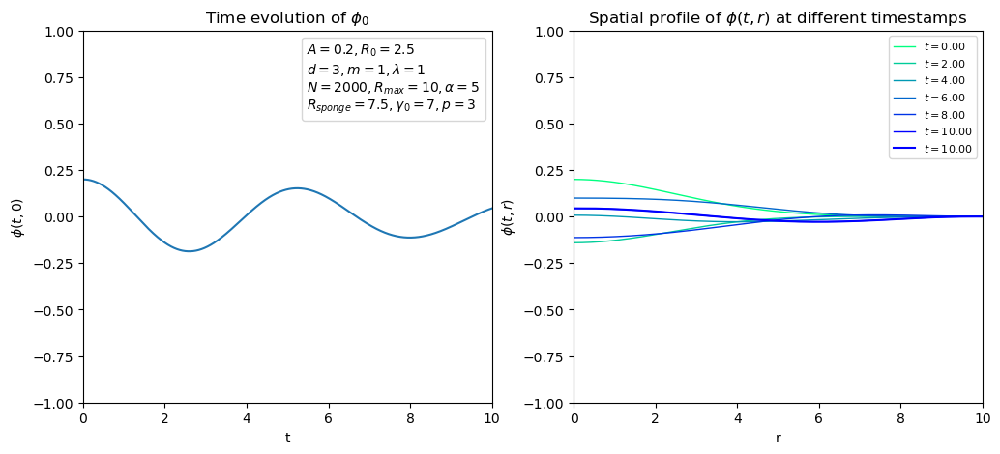

In [17]:
cmap = plt.get_cmap('winter')

end = -1
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
line, = axs[0].plot(solution.t[:end], solution.y[0,:end], label='$\\phi(t,0)$')
axs[0].set_title('Time evolution of $\\phi_0$')
axs[0].set_xlabel('t')
axs[0].set_ylabel('$\\phi(t,0)$')
axs[0].set_xlim([0, T])
axs[0].set_ylim([-5*A, 5*A])
params = Line2D([0], [0], color="none", marker="", linestyle="none", 
                label=rf"$A={A}, R_0={R_0}$"+"\n"
                +rf"$d={d}, m={m}, \lambda={mu}$"+"\n"
                +rf"$N={N}, R_{{max}}={R_max}, \alpha={alpha}$"+"\n"
                +rf"$R_{{sponge}}={R_sponge}, \gamma_0={gamma_0}, p={p}$")
axs[0].legend(handles=[params], handlelength=0, handletextpad=0)

for i in range(t0, len(solution.t[:end]), int(len(solution.t[:end])/5)):
    axs[1].plot(r, solution.y[:N,i], color=cmap(1-i/len(solution.t[:end])), linewidth=1, label=f'$t={solution.t[i]:.2f}$')
axs[1].plot(r, solution.y[:N,-1], color=cmap(0), label=f'$t={solution.t[-1]:.2f}$')
axs[1].set_title('Spatial profile of $\\phi(t,r)$ at different timestamps')
axs[1].set_xlabel('r')
axs[1].set_ylabel('$\\phi(t,r)$')
axs[1].set_xlim([0, R_max])
axs[1].set_ylim([-5*A, 5*A])
axs[1].legend(loc='upper right', fontsize=8)

plt.savefig(f"test.jpg")

In [9]:
# Animation of the solution

from IPython.display import HTML

N = len(r)
phi_solution = solution.y[:N, :end]
frames = np.linspace(0, len(solution.t[:end])-1, 300).astype(int)

fig, ax = plt.subplots()

line, = ax.plot(r, phi_solution[:, 0])

ax.set_xlim(r.min(), r.max())

# Fixed y limits are important; otherwise the plot can jump around
ymin = -0.5 #phi_solution.min()
ymax = 0.5 #phi_solution.max()
margin = 0.05 * (ymax - ymin)
ax.set_ylim(ymin - margin, ymax + margin)

ax.set_xlabel("r")
ax.set_ylabel(r"$\phi(r,t)$")
ax.set_title("Time evolution of $\phi(r,t)$")

time_text = ax.text(
    0.02, 0.95, "",
    transform=ax.transAxes
)

params = Line2D([0], [0], color="none", marker="", linestyle="none", 
                label=rf"$A={A}, R_0={R_0}$"+"\n"
                +rf"$d={d}, m={m}, \lambda={mu}$"+"\n"
                +rf"$N={N}, R_{{max}}={R_max}, \alpha={alpha}$"+"\n"
                +rf"$R_{{sponge}}={R_sponge}, \gamma_0={gamma_0}, p={p}$")
ax.legend(handles=[params], handlelength=0, handletextpad=0)

def update(frame):
    line.set_ydata(phi_solution[:, frame])
    time_text.set_text(f"t = {solution.t[frame]:.4f}")
    return line, time_text

animation = FuncAnimation(
    fig,
    update,
    frames=frames,
    interval=30,
    blit=True
)

plt.close(fig)  # Prevents a separate static figure from appearing

with open(f"test.html", "w") as f:
    f.write(animation.to_jshtml())
HTML(animation.to_jshtml())

In [10]:
# Energy

def energy_density(phi, PI, x):
    return 1/2*PI**2 + 1/(2*x**2)*(np.gradient(phi, r))**2 + V(phi)

def energy(phi, PI):
    total_energy = 4*np.pi*np.trapz(energy_density(phi, PI, x) * r**(d-1), r)
    return total_energy

# Core

def core_radius(phi, PI):
    total_energy = energy(phi, PI)
    cumulative_energy = np.cumsum(energy_density(phi, PI) * r**(d-1) * np.gradient(r))
    core_radius_index = np.where(cumulative_energy >= 0.9 * total_energy)[0][0]
    return r[core_radius_index]

def mean_square_radius(phi, PI):
    total_energy = energy(phi, PI)
    cumulative_energy = np.cumsum(energy_density(phi, PI) * r**(d-1) * np.gradient(r))
    mean_square_radius = np.trapz(cumulative_energy * r**2, r) / total_energy
    return mean_square_radius

C:\Users\msztr\AppData\Local\Temp\ipykernel_21636\771145005.py:4: RuntimeWarning: divide by zero encountered in divide
  return 1/2*PI**2 + 1/(2*x**2)*(np.gradient(phi, r))**2 + V(phi)
C:\Users\msztr\AppData\Local\Temp\ipykernel_21636\771145005.py:7: RuntimeWarning: invalid value encountered in multiply
  total_energy = 4*np.pi*np.trapz(energy_density(phi, PI, x) * r**(d-1), r)
C:\Users\msztr\AppData\Local\Temp\ipykernel_21636\771145005.py:7: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_energy = 4*np.pi*np.trapz(energy_density(phi, PI, x) * r**(d-1), r)


Text(0, 0.5, 'Total Energy')

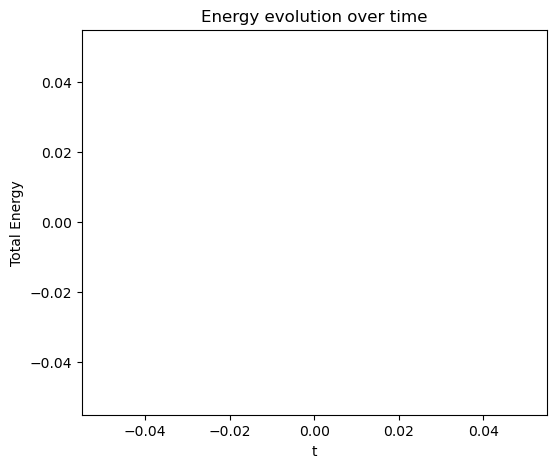

In [11]:
# Energy evolution

energies = []
for i in range(len(solution.y[0])):
    phi_i = solution.y[:N, i]
    Pi_i = solution.y[N:, i]
    energies.append(energy(phi_i, Pi_i))

plt.figure(figsize=(6, 5))
plt.plot(solution.t, energies)
plt.title('Energy evolution over time')
plt.xlabel('t')
plt.ylabel('Total Energy')

In [12]:
# Core radius evolution

core_radii_1 = []
core_radii_2 = []
for i in range(len(solution.y[0])):
    phi_i = solution.y[:N, i]
    Pi_i = solution.y[N:, i]
    core_radii_1.append(core_radius(phi_i, Pi_i))
    core_radii_2.append(mean_square_radius(phi_i, Pi_i))

plt.figure(figsize=(6, 5))
plt.plot(solution.t, core_radii_1, label='Core radius')
plt.plot(solution.t, core_radii_2, label='Mean square radius')
plt.title('Core radius evolution over time')
plt.xlabel('t')
plt.ylabel('Core radius')
plt.legend()

C:\Users\msztr\AppData\Local\Temp\ipykernel_21636\771145005.py:4: RuntimeWarning: divide by zero encountered in divide
  return 1/2*PI**2 + 1/(2*x**2)*(np.gradient(phi, r))**2 + V(phi)
C:\Users\msztr\AppData\Local\Temp\ipykernel_21636\771145005.py:7: RuntimeWarning: invalid value encountered in multiply
  total_energy = 4*np.pi*np.trapz(energy_density(phi, PI, x) * r**(d-1), r)
C:\Users\msztr\AppData\Local\Temp\ipykernel_21636\771145005.py:7: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_energy = 4*np.pi*np.trapz(energy_density(phi, PI, x) * r**(d-1), r)


TypeError: energy_density() missing 1 required positional argument: 'x'